# 911 Calls Analysis

We will be analyzing some 911 call data from [Kaggle](https://www.kaggle.com/mchirico/montcoalert). The data contains the following fields:

* lat : String variable, Latitude
* lng: String variable, Longitude
* desc: String variable, Description of the Emergency Call
* zip: String variable, Zipcode
* title: String variable, Title
* timeStamp: String variable, YYYY-MM-DD HH:MM:SS
* twp: String variable, Township
* addr: String variable, Address
* e: String variable, Dummy variable (always 1)

Questions to answer: 
1. What are the top 5 zipcodes for 911 calls? 
2. What are the top 5 townsihps for 911 calls? 
1. What emergency services (EMS, Fire, Traffic) are used the most? 
2. What are the main reasons for 911 calls? 
3. Where are the 911 calls coming from? 
4. What are the most popular times, days, and months for 911 calls?
5. Are there higher number of 911 calls on holidays? 



## Data and Setup

____
** Import libraries and data **

In [97]:
import numpy as np
import pandas as pd

In [98]:
import seaborn as sns
import datetime as dt
import matplotlib.pyplot as plt
%matplotlib inline

In [99]:
df = pd.read_csv('911.csv', dtype={'title': str, 'timeStamp': str, 'addr': str, 'e': str, 'desc': str, 'zip': str }, parse_dates=[5], infer_datetime_format=True, index_col='timeStamp')

In [100]:
df.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 99492 entries, 2015-12-10 17:40:00 to 2016-08-24 11:17:02
Data columns (total 8 columns):
lat      99492 non-null float64
lng      99492 non-null float64
desc     99492 non-null object
zip      86637 non-null object
title    99492 non-null object
twp      99449 non-null object
addr     98973 non-null object
e        99492 non-null object
dtypes: float64(2), object(6)
memory usage: 6.8+ MB


** Check the head of df **

In [101]:
df.head(2)

,lat,lng,desc,zip,title,twp,addr,e
timeStamp,,,,,,,,
2015-12-10 17:40:00,40.297876,-75.581294,REINDEER CT & DEAD END; NEW HANOVER; Station ...,19525,EMS: BACK PAINS/INJURY,NEW HANOVER,REINDEER CT & DEAD END,1
2015-12-10 17:40:00,40.258061,-75.264680,BRIAR PATH & WHITEMARSH LN; HATFIELD TOWNSHIP...,19446,EMS: DIABETIC EMERGENCY,HATFIELD TOWNSHIP,BRIAR PATH & WHITEMARSH LN,1


## Basic Questions

** What are the top 5 zipcodes for 911 calls? **

In [102]:
df['zip'].value_counts().head(5)

19401    6979
19464    6643
19403    4854
19446    4748
19406    3174
Name: zip, dtype: int64

** What are the top 5 townships (twp) for 911 calls? **

In [103]:
df['twp'].value_counts().head(5)

LOWER MERION    8443
ABINGTON        5977
NORRISTOWN      5890
UPPER MERION    5227
CHELTENHAM      4575
Name: twp, dtype: int64

## Creating new features

**What are the top reasons for 911 calls? **

Ans. Vehicle accident seems by far the most common reason for 911 call. 

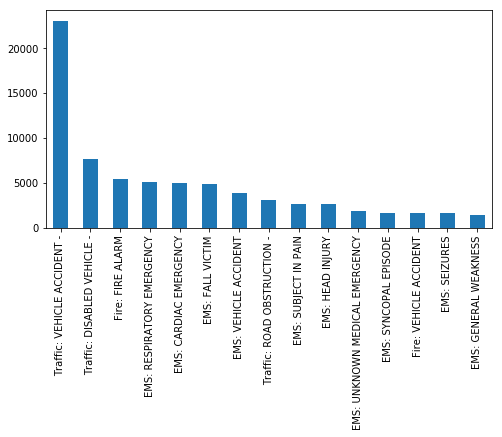

In [104]:
plt.figure(figsize=(8,4))
df['title'].value_counts().head(15).plot(kind='bar')

** What are the most common 911 emergency services? **

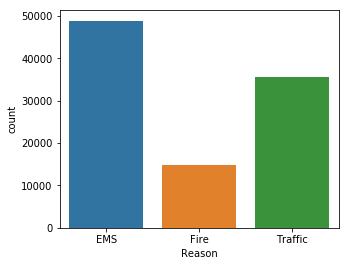

In [105]:
df['Reason'] = df['title'].apply(lambda x: x.split(':')[0])
df['Detailed Reason'] = df['title'].apply(lambda x: x.split(':')[1])
df['Reason'].value_counts()
plt.figure(figsize=(5,4))
sns.countplot(data=df, x='Reason')

**What are the top locations to get 911 calls from? **

** Let's go in detail on top 2 intersections where 911 calls are placed to **

Ans: SHANNONDELL DR. AND SHANNONDELL BLVD - 938 calls. There is a retirement community on this street. Likely, that's the reason for this number of calls. 

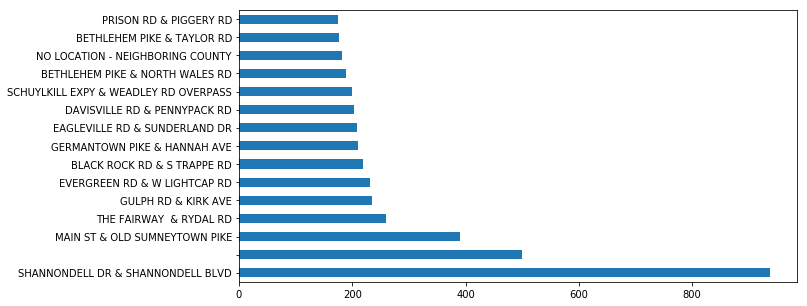

In [106]:
df['Intersection'] = df['desc'].apply(lambda x: x.split(';')[0])

plt.figure(figsize=(10,5))
df['Intersection'].value_counts().head(15).plot(kind='barh')

At the SHANNONDELL DR. AND SHANNONDELL BLVD address, most of the calls are for 'Medical Alert Alarm', then 'Fall Victim. This makes sense given the location of a  retirement home. 

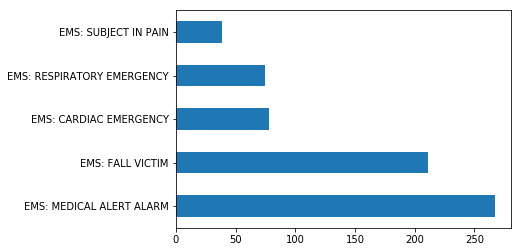

In [107]:
df[df['Intersection']=='SHANNONDELL DR & SHANNONDELL BLVD']['title'].value_counts().head(5).plot(kind='barh')

For medical emergency reasons for MAIN ST & OLD SUMNEYTOWN PIKE, there isn't a cause for the high amount of calls that stands out. There are some closeby businesses that would generate the amount of traffic for this to be a populous area.  Here's a Google maps image of the location:
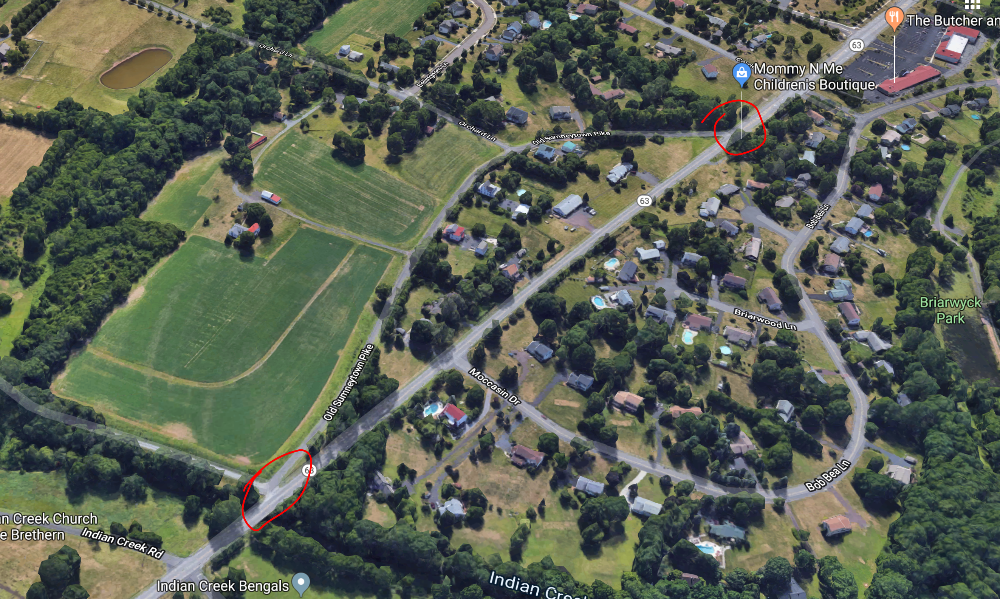

For MAIN ST & OLD SUMNEYTOWN PIKE intersection, the main reason for the 911 call seems to be due to a Fall Victim. 

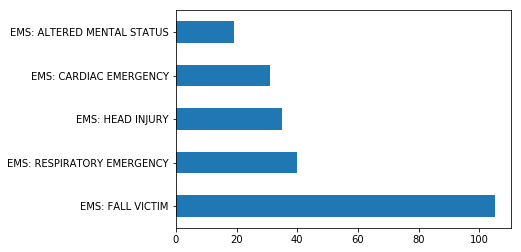

In [108]:
df[df['Intersection']=='MAIN ST & OLD SUMNEYTOWN PIKE']['title'].value_counts().head(5).plot(kind='barh')

Extracting date and time specific attributed from the timeStamp

In [110]:
df['Hour'] = df.index.map(lambda x: x.hour)
df['Month'] = df.index.map(lambda x: x.month)
df['Date'] = df.index.map(lambda x: x.date)
df['Day of Week'] = df.index.map(lambda x: x.weekday)

In [111]:
dmap = {0:'Mon',1:'Tue',2:'Wed',3:'Thu',4:'Fri',5:'Sat',6:'Sun'}  # dictionary to convert ints to day strings
df['Day of Week'] = df['Day of Week'].map(dmap)
df['Day of Week'].head()

timeStamp
2015-12-10 17:40:00    Thu
2015-12-10 17:40:00    Thu
2015-12-10 17:40:00    Thu
2015-12-10 17:40:01    Thu
2015-12-10 17:40:01    Thu
Name: Day of Week, dtype: object

** What is the emergency service counts per weekday? **

Seems like 'Fire' services are consistent throughout the week. The count of 'Traffic' services varies quite a lot - it is lowest on Sundays, and lower than usual on Saturday and Monday. 'EMS' services also seem to be lower than usual on Saturday and Sunday. 

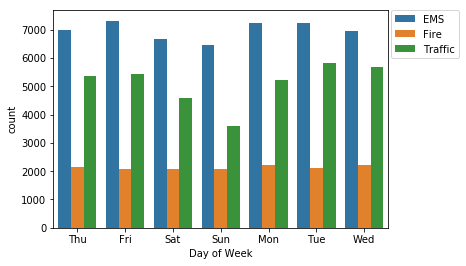

In [69]:
sns.countplot(data=df, x='Day of Week', hue='Reason')
plt.legend(loc=(1.01,0.78))

** What are the emergency service counts per month? **

We are missing data for months 9, 10, and 11. Months 8 and 12 have lower counts overall than other months. This is interesting - take a closer look at distribution of counts in those months. 

'Traffic' services had a high count for January, then decreased for February, and decreased further for March. 

'Fire' services seem to be somewhat constant with some variation. 

'EMS' services seem to be somewhat constant except for the month of February. 

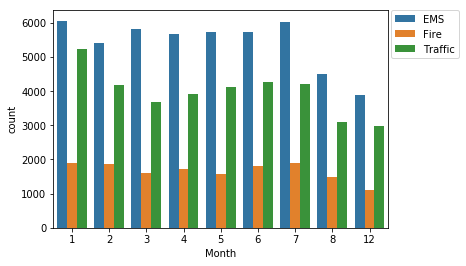

In [70]:
sns.countplot(data=df, x='Month', hue='Reason')
plt.legend(loc=(1.01,0.78))

** Line plot of month counts **

(1, 10)

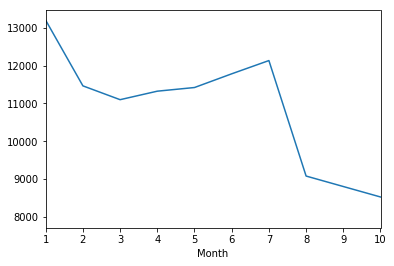

In [113]:
df_month = df.groupby(by='Month').count()
df_month['lat'].plot()
plt.xlim(1,10)

** Missing Data **
Reason why August data is less is because data is missing for the month past 2016-08-24 11:17:02.

Reason why December data is less is because data is missing for the month until 2015-12-10 17:40:00	

We are missing data for months of September, October, and November. 

In [73]:
df[df['Month']==8].tail(2)

,lat,lng,desc,zip,title,twp,addr,e,Reason,Detailed Reason,Intersection,Hour,Month,Day of Week,Date
timeStamp,,,,,,,,,,,,,,,
2016-08-24 11:17:01,40.186431,-75.192555,WELSH RD & WEBSTER LN; HORSHAM; Station 352; ...,19002,EMS: NAUSEA/VOMITING,HORSHAM,WELSH RD & WEBSTER LN,1,EMS,NAUSEA/VOMITING,WELSH RD & WEBSTER LN,11,8,Wed,2016-08-24
2016-08-24 11:17:02,40.207055,-75.317952,MORRIS RD & S BROAD ST; UPPER GWYNEDD; 2016-08...,19446,Traffic: VEHICLE ACCIDENT -,UPPER GWYNEDD,MORRIS RD & S BROAD ST,1,Traffic,VEHICLE ACCIDENT -,MORRIS RD & S BROAD ST,11,8,Wed,2016-08-24


In [74]:
df[df['Month']==12].head(2)

,lat,lng,desc,zip,title,twp,addr,e,Reason,Detailed Reason,Intersection,Hour,Month,Day of Week,Date
timeStamp,,,,,,,,,,,,,,,
2015-12-10 17:40:00,40.297876,-75.581294,REINDEER CT & DEAD END; NEW HANOVER; Station ...,19525,EMS: BACK PAINS/INJURY,NEW HANOVER,REINDEER CT & DEAD END,1,EMS,BACK PAINS/INJURY,REINDEER CT & DEAD END,17,12,Thu,2015-12-10
2015-12-10 17:40:00,40.258061,-75.264680,BRIAR PATH & WHITEMARSH LN; HATFIELD TOWNSHIP...,19446,EMS: DIABETIC EMERGENCY,HATFIELD TOWNSHIP,BRIAR PATH & WHITEMARSH LN,1,EMS,DIABETIC EMERGENCY,BRIAR PATH & WHITEMARSH LN,17,12,Thu,2015-12-10


**Is there higher count of calls on Holidays? For example, July 4th? **

Ans: No

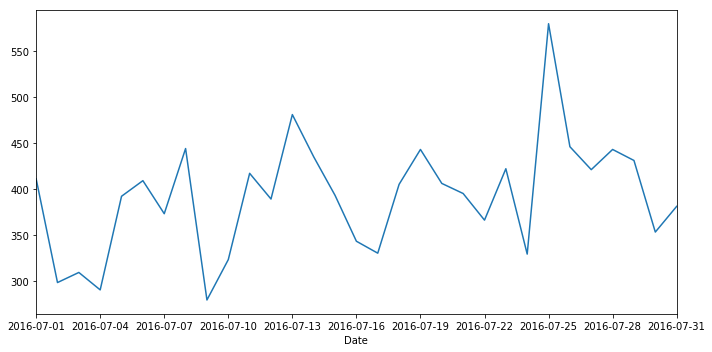

In [75]:
plt.figure(figsize=(10,5))
df[df['Month']==7].groupby(by='Date').count()['Reason'].plot()
plt.tight_layout()

** What do the 'Traffic' call counts look like per date? **

Most consistent with some peaks. Biggest peaek in January. 

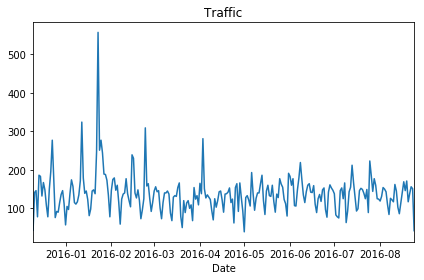

In [78]:
df[df['Reason']=='Traffic'].groupby('Date').count()['lat'].plot()
plt.title('Traffic')
plt.tight_layout()

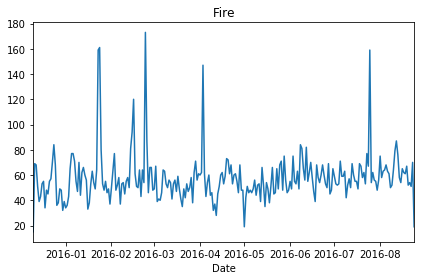

In [79]:
df[df['Reason']=='Fire'].groupby('Date').count()['lat'].plot()
plt.title('Fire')
plt.tight_layout()

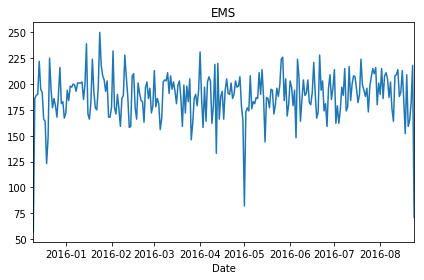

In [80]:
df[df['Reason']=='EMS'].groupby('Date').count()['lat'].plot()
plt.title('EMS')
plt.tight_layout()

** Let's see the relationship of weekday, hour, and months **

In [81]:
day_hour= df.groupby(['Day of Week', 'Hour']).count()['Reason'].unstack()

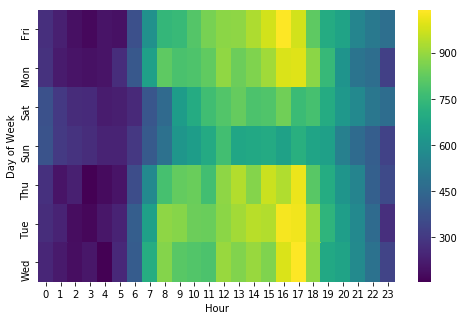

In [120]:
plt.figure(figsize=(8,5))
sns.heatmap(data=day_hour, cmap='viridis')

The highest count of calls seems to be on Weekdays between 4-6PM. This makes sense as this time is the end of workday, and a lot of traffic is generated then. 

**Let's look at what the relationship is between the type of emergency and time of day. **

Text(0.5,1,'Fire')

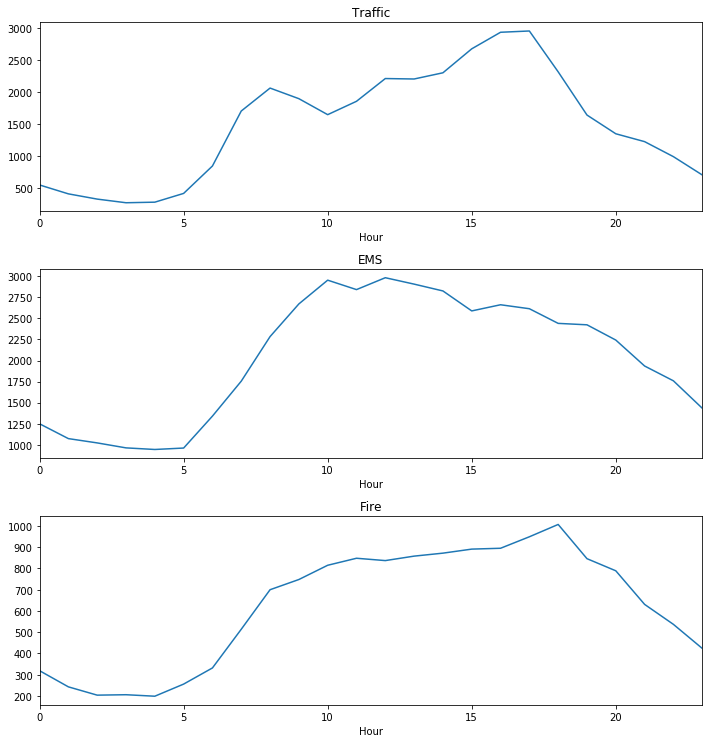

In [129]:
fizsize_with_subplots = (10,10)
fig = plt.figure(figsize=fizsize_with_subplots) 
fig_dims = (3, 1)

plt.subplot2grid(fig_dims, (0,0))
df[df['Reason']=='Traffic'].groupby(['Hour']).count()['Reason'].plot()
plt.title ('Traffic')

plt.subplot2grid(fig_dims, (1,0))
df[df['Reason']=='EMS'].groupby(['Hour']).count()['Reason'].plot()
plt.title ('EMS')
plt.tight_layout()

plt.subplot2grid(fig_dims, (2,0))
df[df['Reason']=='Fire'].groupby(['Hour']).count()['Reason'].plot()
plt.title ('Fire')

'Traffic' and 'Fire' trends seem to trend together. On the other hand, 'EMS' is different and peaks around 10-11AM instead. 

** Clustermap to show other relations between Day of Week and Hour **

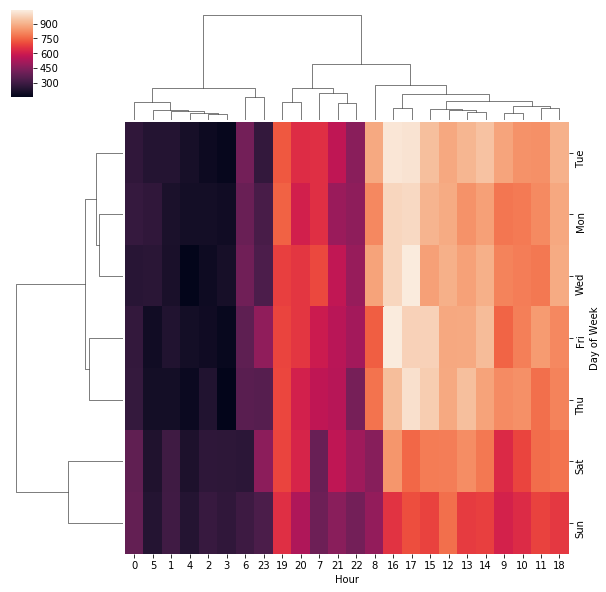

In [83]:
sns.clustermap(data=day_hour)

** Let's create a clustermap for Day of Week vs Month **

In [130]:
day_month = df.groupby(by=['Day of Week', 'Month'])['Reason'].count().unstack()

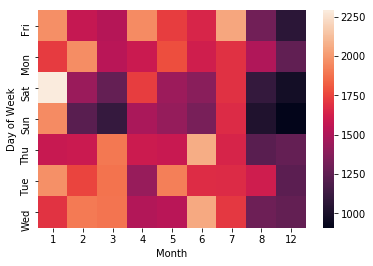

In [85]:
sns.heatmap(data=day_month)

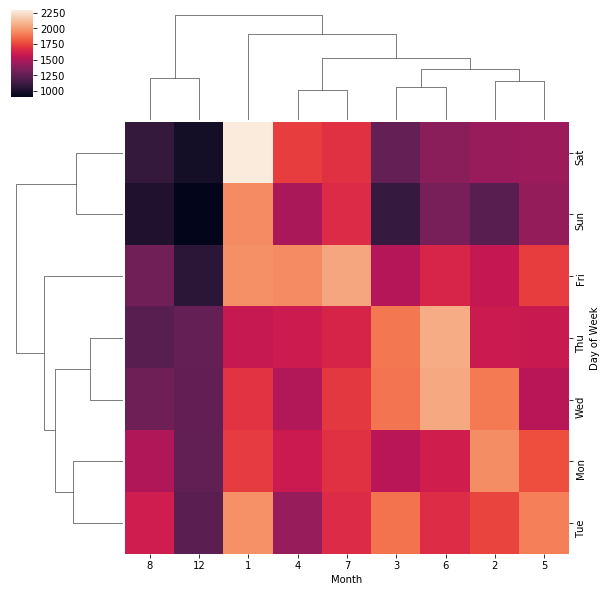

In [86]:
sns.clustermap(data=day_month)

Saturdays in January saw the highest counts of 911 calls. 